### Test spectral reconstruction
##### TODO
- pull together hparams for spctrogramming vs spectrogramming PHGI

##### contents
- load syllable_df
- test griffin lim
    - create spectrogram
    - invert spectrogram
- Phase gradient heap integration  (https://github.com/andimarafioti/tifresi)
    - create spectrogram 
    - invert spectrogram
- Single pass spectrogram inversion
    - create spectrogram
    - invert spectrogram

### load spectrogram dataframe

In [1]:
%env CUDA_DEVICE_ORDER=PCI_BUS_ID
%env CUDA_VISIBLE_DEVICES=2

env: CUDA_DEVICE_ORDER=PCI_BUS_ID
env: CUDA_VISIBLE_DEVICES=2


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm.autonotebook import tqdm
from joblib import Parallel, delayed
import pandas as pd

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [4]:
from avgn.utils.paths import DATA_DIR, most_recent_subdirectory, ensure_dir
from avgn.signalprocessing.create_spectrogram_dataset import flatten_spectrograms
from avgn.visualization.spectrogram import draw_spec_set
from avgn.visualization.quickplots import draw_projection_plots

### Collect data

In [5]:
import urllib.request
import io
import soundfile as sf
from IPython.display import display, Audio

In [6]:
url = "https://raw.githubusercontent.com/timsainb/python_spectrograms_and_inversion/master/bushOffersPeace.wav"

In [7]:
response = urllib.request.urlopen(url)
signal, rate = sf.read(io.BytesIO(response.read()))

In [8]:
display(Audio(signal, rate=rate))

In [9]:
from avgn.utils.hparams import HParams

### Phase gradient heap integration
- relies on gaussian windowing

In [54]:
from avgn.signalprocessing.spectrogramming import _build_mel_basis, _build_mel_inversion_basis, _mel_to_linear
from avgn.signalprocessing.PHGI import spectrogram, invert_spectrogram, melspectrogram, spectrogram_no_norm

In [55]:
hparams = HParams(
    num_mels = 128,
    mel_lower_edge_hertz=50,
    mel_upper_edge_hertz=8000,
    dynamic_range_dB = 50,
    hop_length_ms = 10,
    win_length_ms = 40,
    ref_level_db=20,
    min_level_db=-110
)

In [56]:
_mel_basis = _build_mel_basis(hparams, rate, rate, use_n_fft = False)
_mel_inversion_basis = _build_mel_inversion_basis(_mel_basis)

In [ ]:
specnn = spectrogram(signal, rate, hparams)


In [57]:
spec = spectrogram(signal, rate, hparams)
melspec = melspectrogram(signal, rate, hparams, _mel_basis)
mel_inv_spec = _mel_to_linear(melspec, _mel_inverse_basis = _mel_inversion_basis)

In [58]:
# invert audio of spec
inv_spec, denorm_spectrogram = invert_spectrogram(spec, rate, hparams)

In [59]:
# invert audio of mel spec
inv_mel_spec, _ = invert_spectrogram(mel_inv_spec, rate, hparams)

In [60]:
display(Audio(inv_spec, rate=rate))

In [61]:
display(Audio(inv_mel_spec, rate=rate))

In [62]:
spec_pghi = spec

Text(0.5, 1.0, 'Spectrogram')

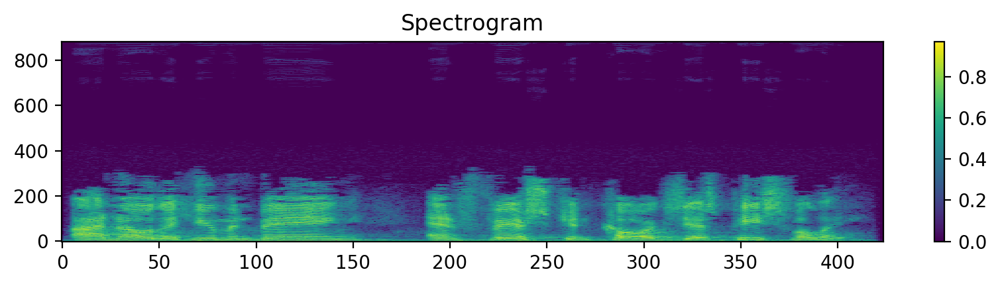

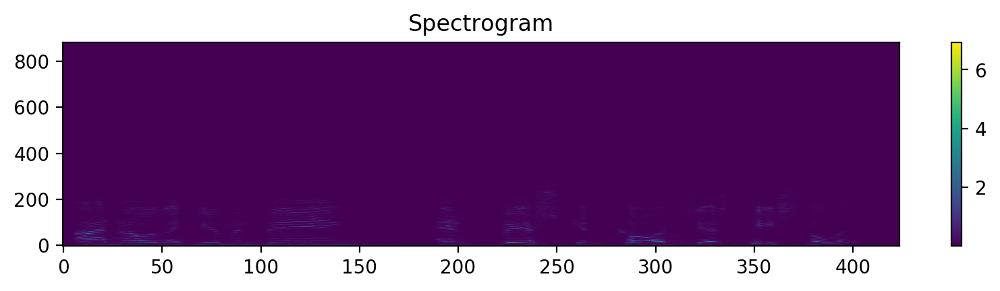

In [63]:
S_inv = _db_to_amp(_denormalize(spec, hparams) + hparams.ref_level_db) 


fig = plt.figure(dpi=200, figsize=(10,2))
im = plt.imshow(spec, origin="lower", aspect="auto")
fig.colorbar(im)
plt.title('Spectrogram')

fig = plt.figure(dpi=200, figsize=(10,2))
im = plt.imshow(S_inv, origin="lower", aspect="auto")
fig.colorbar(im)
plt.title('Spectrogram')

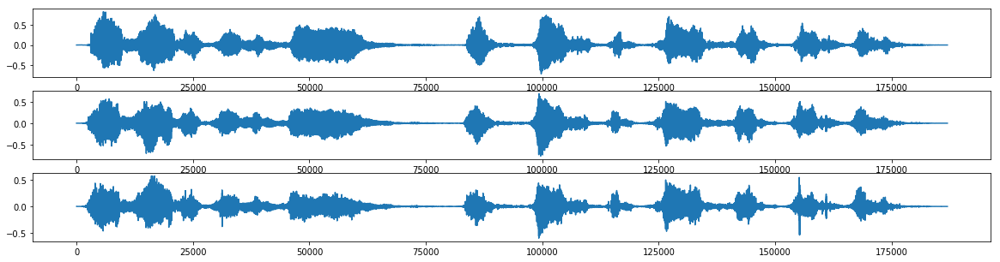

In [18]:
fig, axs = plt.subplots(nrows=3, figsize=(20,5))
axs[0].plot(signal[:len(inv_spec)])
axs[1].plot(inv_spec)
axs[2].plot(inv_mel_spec)

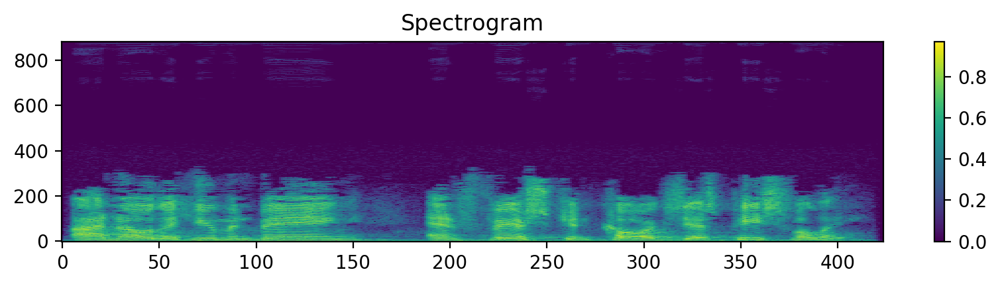

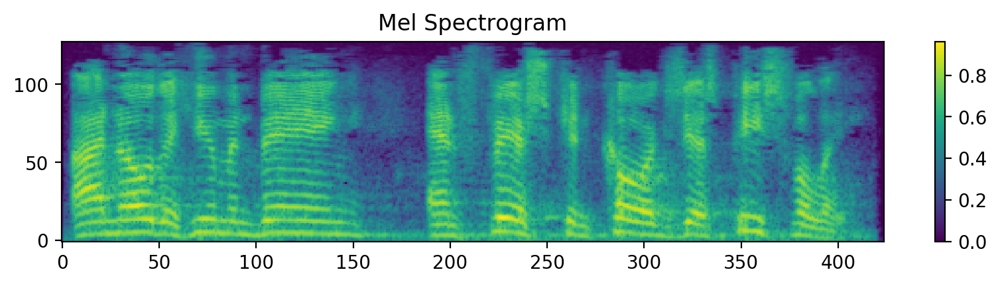

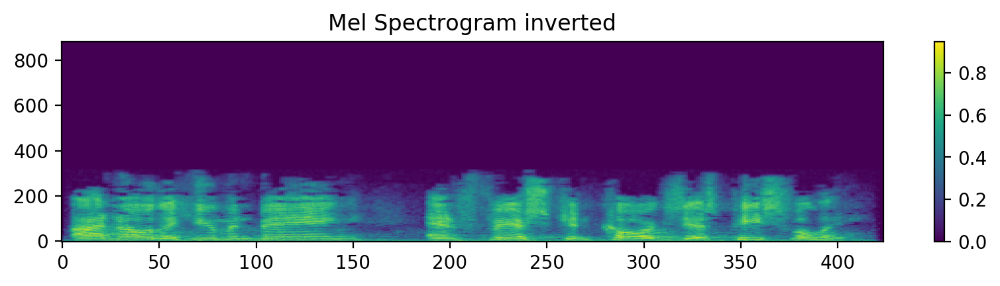

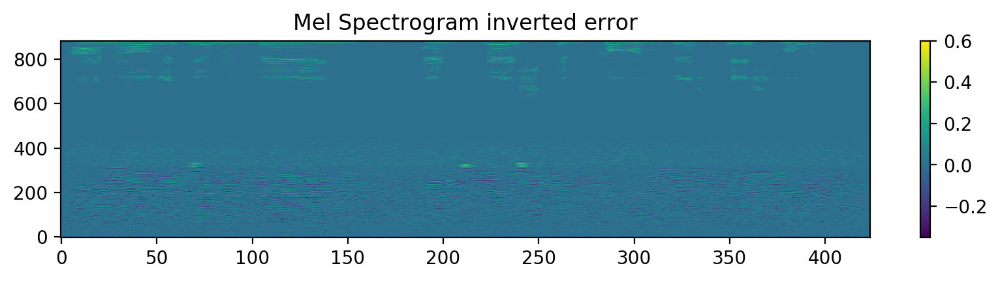

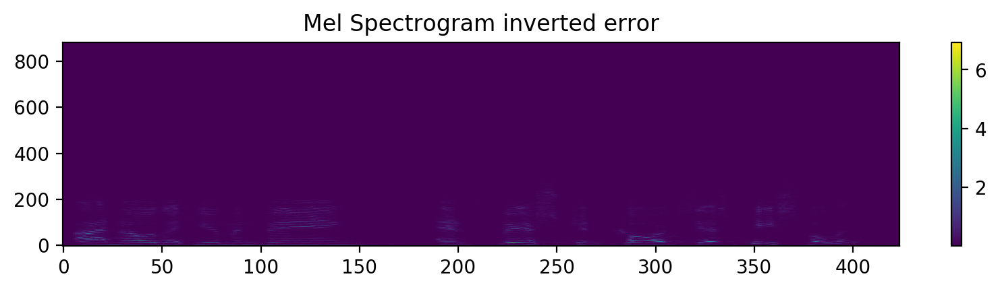

In [19]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

fig = plt.figure(dpi=200, figsize=(10,2))
im = plt.imshow(spec, origin="lower", aspect="auto")
fig.colorbar(im)
plt.title('Spectrogram')

fig = plt.figure(dpi=200, figsize=(10,2))
im2 = plt.imshow(melspec, origin="lower", aspect="auto")
plt.title('Mel Spectrogram')
plt.colorbar(im2)

fig = plt.figure(dpi=200, figsize=(10,2))
im3 = plt.imshow(mel_inv_spec, origin="lower", aspect="auto")
plt.title('Mel Spectrogram inverted')
fig.colorbar(im3)
plt.show()

fig = plt.figure(dpi=200, figsize=(10,2))
im3 = plt.imshow(spec - mel_inv_spec, origin="lower", aspect="auto")
plt.title('Mel Spectrogram inverted error')
fig.colorbar(im3)
plt.show()

fig = plt.figure(dpi=200, figsize=(10,2))
im3 = plt.imshow(denorm_spectrogram, origin="lower", aspect="auto")
plt.title('Mel Spectrogram inverted error')
fig.colorbar(im3)
plt.show()

### Griffin Lim Inversion

In [20]:
from avgn.signalprocessing.spectrogramming import spectrogram, melspectrogram, inv_spectrogram

In [21]:
hparams = HParams(
    num_mels = 128,
    mel_lower_edge_hertz=50,
    mel_upper_edge_hertz=8000,
    dynamic_range_dB = 50,
    hop_length_ms = 10,
    win_length_ms = 20,
    ref_level_db=20,
    n_fft=2048,
    min_level_db=-110,
    griffin_lim_iters=32
)

In [22]:
_mel_basis = _build_mel_basis(hparams, rate, rate)
_mel_inversion_basis = _build_mel_inversion_basis(_mel_basis)

In [23]:
spec = spectrogram(signal, rate, hparams)
melspec = melspectrogram(signal, rate, hparams, _mel_basis)
mel_inv_spec = _mel_to_linear(melspec, _mel_inverse_basis = _mel_inversion_basis)

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/scipy/signal/signaltools.py:1344: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = out_full[ind]


In [24]:
inv_spec = inv_spectrogram(spec, rate, hparams)
inv_spec_mel = inv_spectrogram(mel_inv_spec, rate, hparams)

In [25]:
display(Audio(inv_spec, rate=rate))

In [26]:
display(Audio(inv_spec_mel, rate=rate))

In [27]:
from librosa.core import griffinlim

In [28]:
from avgn.signalprocessing.spectrogramming import _db_to_amp, _denormalize, _amp_to_db, _normalize

In [29]:
fs = rate
S = _db_to_amp(
        _denormalize(spec, hparams) + hparams.ref_level_db
)
hop_length=int(hparams.hop_length_ms / 1000 * fs)
win_length=int(hparams.win_length_ms / 1000 * fs)
y2 = griffinlim(S, hop_length=hop_length, win_length = win_length)
display(Audio(y2, rate=rate))

In [30]:
# normal librosa
import librosa
S = np.abs(librosa.stft(signal))
y_inv = librosa.griffinlim(S)
display(Audio(y_inv, rate=rate))

Text(0.5, 1.0, 'Spectrogram')

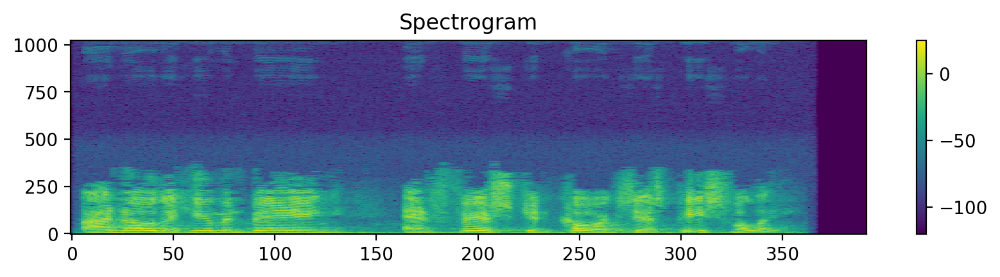

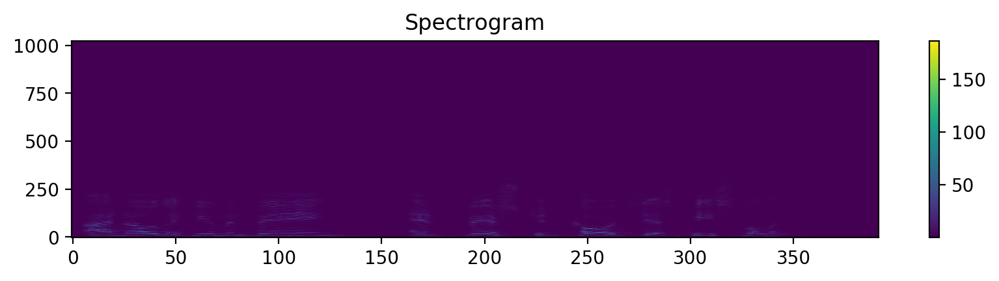

In [33]:
hparams = HParams(
    num_mels = 128,
    mel_lower_edge_hertz=50,
    mel_upper_edge_hertz=8000,
    dynamic_range_dB = 50,
    hop_length_ms = 10,
    win_length_ms = 40,
    ref_level_db=20,
    n_fft=2048,
    min_level_db=-110,
    griffin_lim_iters=32
)

# librosa with normalization
import librosa
S = _amp_to_db(np.abs(librosa.stft(signal))) - hparams.ref_level_db
S_inv = _db_to_amp(S + hparams.ref_level_db) 
y_inv = librosa.griffinlim(S_inv)
display(Audio(y_inv, rate=rate))

fig = plt.figure(dpi=200, figsize=(10,2))
im = plt.imshow(S, origin="lower", aspect="auto")
fig.colorbar(im)
plt.title('Spectrogram')
fig = plt.figure(dpi=200, figsize=(10,2))
im = plt.imshow(S_inv, origin="lower", aspect="auto")
fig.colorbar(im)
plt.title('Spectrogram')

Text(0.5, 1.0, 'Spectrogram')

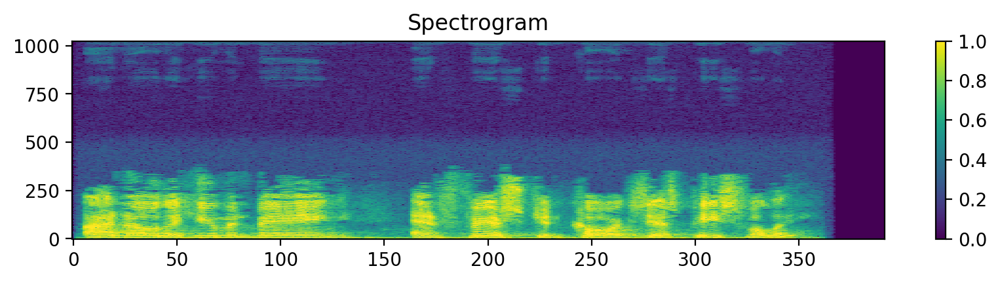

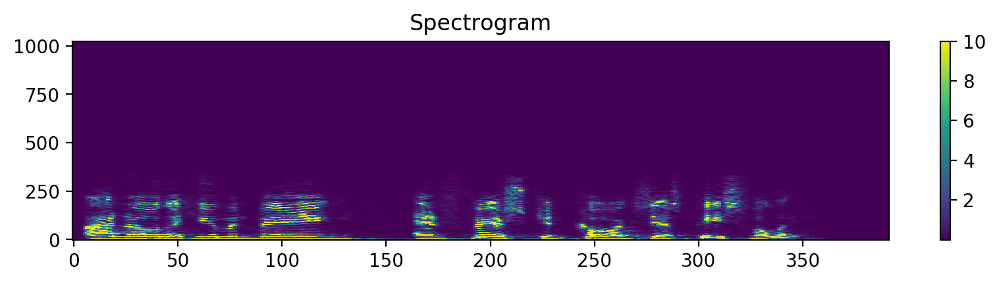

In [64]:
hparams = HParams(
    num_mels = 128,
    mel_lower_edge_hertz=50,
    mel_upper_edge_hertz=8000,
    dynamic_range_dB = 50,
    hop_length_ms = 10,
    win_length_ms = 40,
    ref_level_db=20,
    n_fft=2048,
    min_level_db=-110,
    griffin_lim_iters=32
)

# librosa with normalization
import librosa
D = librosa.stft(signal)
S = _amp_to_db(np.abs(D)) - hparams.ref_level_db
S1 = _normalize(S, hparams)

S_inv = _db_to_amp(_denormalize(S1, hparams) + hparams.ref_level_db) 
y_inv = librosa.griffinlim(S_inv)
display(Audio(y_inv, rate=rate))

fig = plt.figure(dpi=200, figsize=(10,2))
im = plt.imshow(S1, origin="lower", aspect="auto")
fig.colorbar(im)
plt.title('Spectrogram')
fig = plt.figure(dpi=200, figsize=(10,2))
im = plt.imshow(S_inv, origin="lower", aspect="auto")
fig.colorbar(im)
plt.title('Spectrogram')

In [70]:
D = librosa.stft(signal)
S = _amp_to_db(np.abs(D)) - hparams.ref_level_db
S1 = _normalize(S, hparams)

Text(0.5, 1.0, 'Spectrogram')

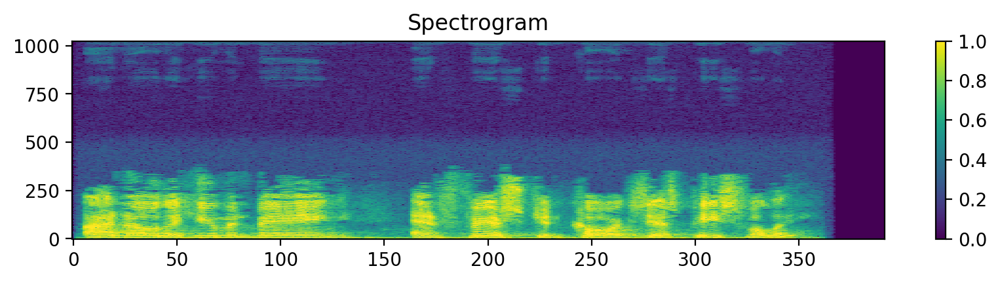

In [71]:
fig = plt.figure(dpi=200, figsize=(10,2))
im = plt.imshow(S1, origin="lower", aspect="auto")
fig.colorbar(im)
plt.title('Spectrogram')

In [74]:
np.max(S1), np.min(S1)

(1.0, 0.0)

In [73]:
np.max(spec_pghi), np.min(spec_pghi)

(0.9711633852372095, 0.0)

Text(0.5, 1.0, 'Spectrogram')

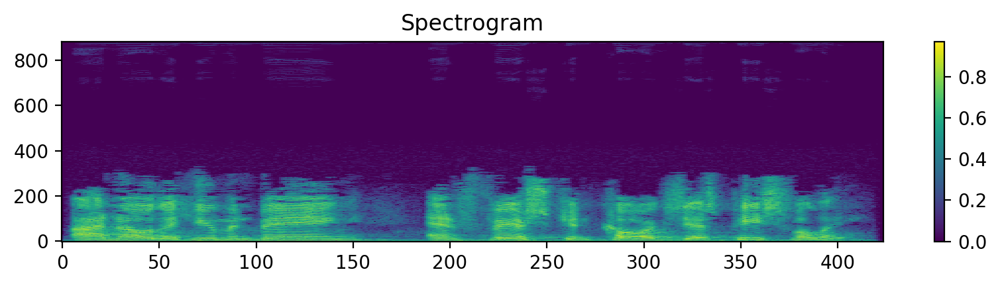

In [65]:
fig = plt.figure(dpi=200, figsize=(10,2))
im = plt.imshow(spec_pghi, origin="lower", aspect="auto")
fig.colorbar(im)
plt.title('Spectrogram')

In [304]:
S = np.abs(librosa.stft(signal), hop_length=int(hparams.hop_length_ms / 1000 * fs),
        win_length=int(hparams.win_length_ms / 1000 * fs),)
fig = plt.figure(dpi=200, figsize=(10,2))
im = plt.imshow(S, origin="lower", aspect="auto")
fig.colorbar(im)
plt.title('Spectrogram')
#S = _normalize(_amp_to_db(S) - hparams.ref_level_db, hparams)
S = _amp_to_db(S)
fig = plt.figure(dpi=200, figsize=(10,2))
im = plt.imshow(S, origin="lower", aspect="auto")
fig.colorbar(im)
plt.title('Spectrogram')

TypeError: 'hop_length' is an invalid keyword to ufunc 'absolute'

In [305]:
hop_length=int(hparams.hop_length_ms / 1000 * fs)
win_length=int(hparams.win_length_ms / 1000 * fs)

Text(0.5, 1.0, 'Spectrogram')

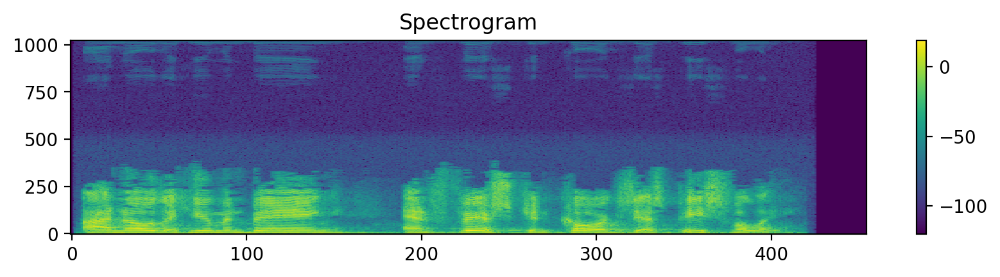

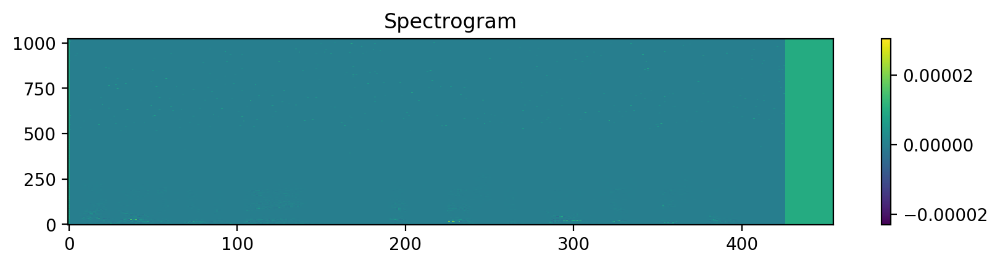

In [318]:
S1 = np.abs(librosa.stft(signal, n_fft=hparams.n_fft, hop_length=hop_length, win_length=win_length))
S = _amp_to_db(S1) - hparams.ref_level_db
#S = _normalize(_amp_to_db(S1) - hparams.ref_level_db, hparams)
fig = plt.figure(dpi=200, figsize=(10,2))
im = plt.imshow(S, origin="lower", aspect="auto")
fig.colorbar(im)
plt.title('Spectrogram')

#S_unlog = _db_to_amp(_denormalize(S, hparams) + hparams.ref_level_db)
S_unlog = _db_to_amp(S + hparams.ref_level_db)
fig = plt.figure(dpi=200, figsize=(10,2))
im = plt.imshow(S_unlog - S1,origin="lower", aspect="auto")
fig.colorbar(im)
plt.title('Spectrogram')

In [319]:
y2 = griffinlim(S_unlog, hop_length=hop_length, win_length = win_length)

display(Audio(y2, rate=rate))

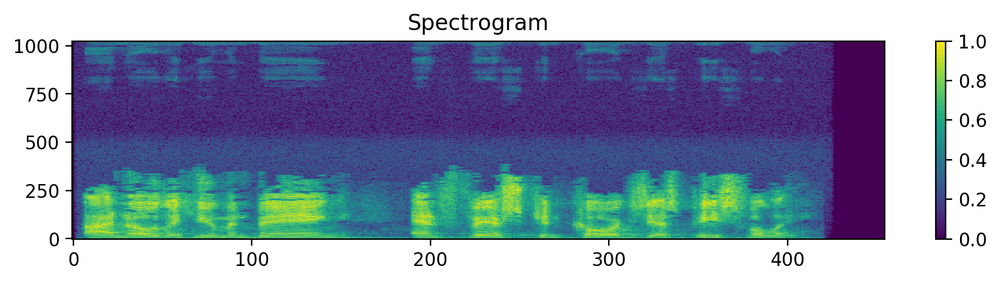

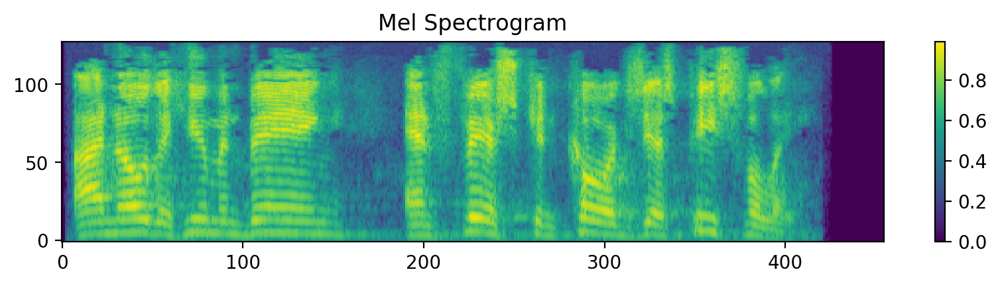

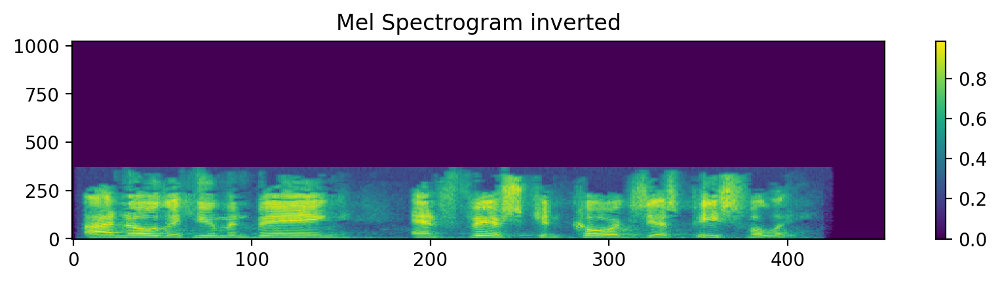

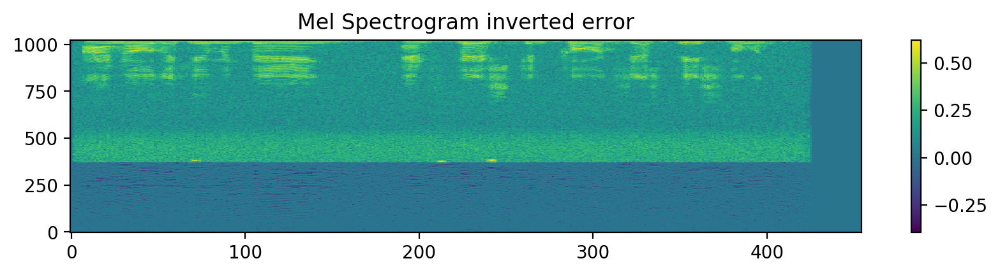

In [200]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

fig = plt.figure(dpi=200, figsize=(10,2))
im = plt.imshow(spec, origin="lower", aspect="auto")
fig.colorbar(im)
plt.title('Spectrogram')

fig = plt.figure(dpi=200, figsize=(10,2))
im2 = plt.imshow(melspec, origin="lower", aspect="auto")
plt.title('Mel Spectrogram')
plt.colorbar(im2)

fig = plt.figure(dpi=200, figsize=(10,2))
im3 = plt.imshow(mel_inv_spec, origin="lower", aspect="auto")
plt.title('Mel Spectrogram inverted')
fig.colorbar(im3)
plt.show()

fig = plt.figure(dpi=200, figsize=(10,2))
im3 = plt.imshow(spec - mel_inv_spec, origin="lower", aspect="auto")
plt.title('Mel Spectrogram inverted error')
fig.colorbar(im3)
plt.show()